## A cycle of reactions A <-> B <-> C <-> A, 
### The "closing" of the cycle (the "return" parth from C to A) is couple with an "energy donor" reaction:
### C + E_High <-> A + E_Low
where E_High and E_Low are, respectively, the high- and low- energy molecules that drive the cycle (for example, think of ATP/ADP)

All 1st-order kinetics.   

LAST REVISED: Jan. 21, 2023

In [1]:
# Extend the sys.path variable, to contain the project's root directory
import set_path
set_path.add_ancestor_dir_to_syspath(2)  # The number of levels to go up 
                                         # to reach the project's home, from the folder containing this notebook

Added 'D:\Docs\- MY CODE\BioSimulations\life123-Win7' to sys.path


In [2]:
from experiments.get_notebook_info import get_notebook_basename

from modules.reactions.reaction_data import ReactionData as chem
from modules.reactions.reaction_dynamics import ReactionDynamics

import numpy as np
import plotly.express as px
from modules.visualization.graphic_log import GraphicLog

In [3]:
# Initialize the HTML logging
log_file = get_notebook_basename() + ".log.htm"    # Use the notebook base filename for the log file

# Set up the use of some specified graphic (Vue) components
GraphicLog.config(filename=log_file,
                  components=["vue_cytoscape_1"],
                  extra_js="https://cdnjs.cloudflare.com/ajax/libs/cytoscape/3.21.2/cytoscape.umd.js")

-> Output will be LOGGED into the file 'irregular_1.log.htm'


### Initialize the system

In [4]:
# Initialize the system
chem_data = chem(names=["A", "B", "C", "E_high", "E_low"])

# Reaction A <-> B, mostly in forward direction (favored energetically)
# Note: all reactions in this experiment have 1st-order kinetics for all species
chem_data.add_reaction(reactants="A", products="B",
                       forward_rate=9., reverse_rate=3.)

# Reaction B <-> C, also favored energetically
chem_data.add_reaction(reactants="B", products="C",
                       forward_rate=8., reverse_rate=4.)

# Reaction C + E_High <-> A + E_Low, also favored energetically, but kinetically slow
# Note that, thanks to the energy donation from E, we can go "upstream" from C, to the higher-energy level of "A"
chem_data.add_reaction(reactants=["C" , "E_high"], products=["A", "E_low"],
                       forward_rate=1., reverse_rate=0.2)

chem_data.describe_reactions()

# Send the plot of the reaction network to the HTML log file
graph_data = chem_data.prepare_graph_network()
GraphicLog.export_plot(graph_data, "vue_cytoscape_1")

Number of reactions: 3 (at temp. 25 C)
0: A <-> B  (kF = 9 / kR = 3 / Delta_G = -2,723.41 / K = 3) | 1st order in all reactants & products
1: B <-> C  (kF = 8 / kR = 4 / Delta_G = -1,718.28 / K = 2) | 1st order in all reactants & products
2: C + E_high <-> A + E_low  (kF = 1 / kR = 0.2 / Delta_G = -3,989.73 / K = 5) | 1st order in all reactants & products
[GRAPHIC ELEMENT SENT TO LOG FILE `irregular_1.log.htm`]


### Set the initial concentrations of all the chemicals

In [5]:
initial_conc = {"A": 100., "B": 0., "C": 0., "E_high": 1000., "E_low": 0.}
initial_conc

{'A': 100.0, 'B': 0.0, 'C': 0.0, 'E_high': 1000.0, 'E_low': 0.0}

In [6]:
dynamics = ReactionDynamics(reaction_data=chem_data)
dynamics.set_conc(conc=initial_conc,
                  snapshot=True)      # Note the abundant energy source
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
5 species:
  Species 0 (A). Conc: 100.0
  Species 1 (B). Conc: 0.0
  Species 2 (C). Conc: 0.0
  Species 3 (E_high). Conc: 1000.0
  Species 4 (E_low). Conc: 0.0


### Start the reaction

In [7]:
dynamics.set_diagnostics()       # To save diagnostic information about the call to single_compartment_react()

dynamics.single_compartment_react(time_step=0.0005, stop_time=0.03, 
                                  dynamic_steps=4, fast_threshold=5)

In [8]:
dynamics.history.get()

,SYSTEM TIME,A,B,C,E_high,E_low,caption
0,0.000000,100.000000,0.000000,0.000000,1000.000000,0.000000,Initial state
1,0.000125,99.887500,0.112500,0.000000,1000.000000,0.000000,"Interm. step, due to the fast rxns: [0, 1, 2]"
2,0.000250,99.775169,0.224719,0.000113,1000.000000,0.000000,"Interm. step, due to the fast rxns: [0, 1, 2]"
3,0.000375,99.663020,0.336657,0.000323,999.999986,0.000014,"Interm. step, due to the fast rxns: [0, 1, 2]"
4,0.000500,99.551066,0.448315,0.000619,999.999946,0.000054,
...,...,...,...,...,...,...,...
236,0.029500,79.838415,20.036804,0.124781,997.514422,2.485578,
237,0.029625,79.766709,20.099134,0.134157,997.503824,2.496176,"Interm. step, due to the fast rxns: [0, 1]"
238,0.029750,79.695106,20.161302,0.143592,997.493226,2.506774,"Interm. step, due to the fast rxns: [0, 1]"
239,0.029875,79.623607,20.223309,0.153084,997.482629,2.517371,"Interm. step, due to the fast rxns: [0, 1]"


In [9]:
dynamics.explain_time_advance()

From time 0 to 0.03, in 240 substeps of 0.000125 (each 1/4 of full step)


In [10]:
dynamics.single_compartment_react(time_step=0.001, stop_time=1.,
                                  dynamic_steps=8, fast_threshold=1)

In [11]:
dynamics.single_compartment_react(time_step=0.005, stop_time=8.,
                                  dynamic_steps=8, fast_threshold=5)

df = dynamics.history.get()
df

,SYSTEM TIME,A,B,C,E_high,E_low,caption
0,0.000000,100.000000,0.000000,0.000000,1000.000000,0.000000,Initial state
1,0.000125,99.887500,0.112500,0.000000,1000.000000,0.000000,"Interm. step, due to the fast rxns: [0, 1, 2]"
2,0.000250,99.775169,0.224719,0.000113,1000.000000,0.000000,"Interm. step, due to the fast rxns: [0, 1, 2]"
3,0.000375,99.663020,0.336657,0.000323,999.999986,0.000014,"Interm. step, due to the fast rxns: [0, 1, 2]"
4,0.000500,99.551066,0.448315,0.000619,999.999946,0.000054,
...,...,...,...,...,...,...,...
15514,7.980000,10.018607,30.006940,59.974453,32.331353,967.668647,
15515,7.985000,10.018458,30.006885,59.974657,32.330768,967.669232,
15516,7.990000,10.018311,30.006830,59.974859,32.330188,967.669812,
15517,7.995000,10.018165,30.006775,59.975060,32.329613,967.670387,


In [12]:
dynamics.explain_time_advance()

From time 0 to 0.03, in 240 substeps of 0.000125 (each 1/4 of full step)
[Ignoring interval starting and ending at same time 0.03]
From time 0.03 to 1, in 7760 substeps of 0.000125 (each 1/8 of full step)
[Ignoring interval starting and ending at same time 1]
From time 1 to 5.37, in 6992 substeps of 0.000625 (each 1/8 of full step)
From time 5.37 to 8, in 526 FULL steps of 0.005


## Plots of changes of concentration with time

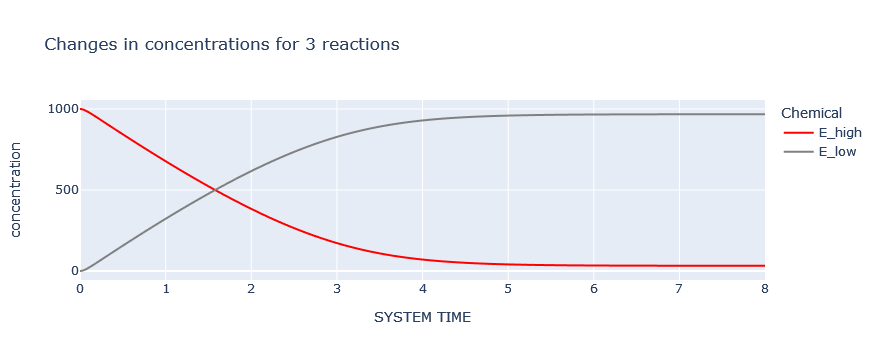

In [13]:
dynamics.plot_curves(chemicals=["E_high", "E_low"], colors=["red", "grey"])

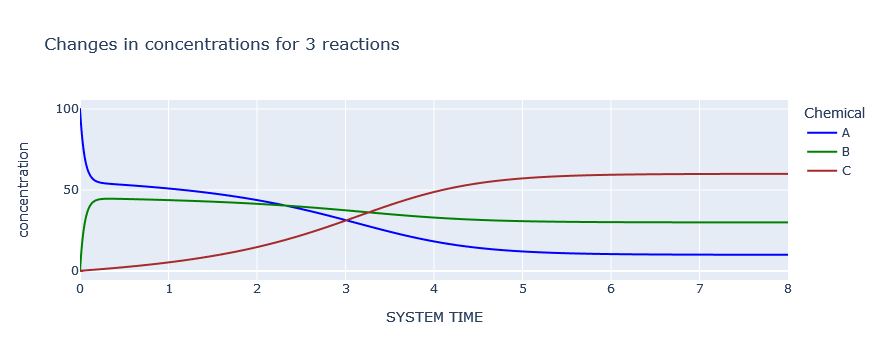

In [14]:
dynamics.plot_curves(chemicals=["A", "B", "C"])

In [15]:
dynamics.curve_intersection(t_start=2.31, t_end=2.33, var1="A", var2="B")

10119


(2.3243749999999728, 40.36817090355426)

In [16]:
dynamics.curve_intersection(t_start=3., t_end=4., var1="A", var2="C")

11216


(3.009999999999958, 31.29078949212642)

In [17]:
dynamics.curve_intersection(t_start=3., t_end=4., var1="B", var2="C")

11620


(3.2624999999999527, 36.19430284526942)

In [18]:
dynamics.is_in_equilibrium(tolerance=4)

A <-> B
Final concentrations:  [B] = 30.01 ; [A] = 10.02
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 2.99527
    Formula used:  [B] / [A]
2. Ratio of forward/reverse reaction rates: 3.0
Discrepancy between the two values: 0.1575 %
Reaction IS in equilibrium (within 4% tolerance)

B <-> C
Final concentrations:  [C] = 59.98 ; [B] = 30.01
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 1.99873
    Formula used:  [C] / [B]
2. Ratio of forward/reverse reaction rates: 2.0
Discrepancy between the two values: 0.06363 %
Reaction IS in equilibrium (within 4% tolerance)

C + E_high <-> A + E_low
Final concentrations:  [A] = 10.02 ; [E_low] = 967.7 ; [C] = 59.98 ; [E_high] = 32.33
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 4.99971
    Formula used:  ([A][E_low]) / ([C][E_high])
2. Ratio of forward/reverse reaction rates: 5.0
Discrepancy between the two values: 0.005842 %
Reaction IS in equilibrium (within 4% 

True

In [19]:
df.head(22)

,SYSTEM TIME,A,B,C,E_high,E_low,caption
0,0.000000,100.000000,0.000000,0.000000,1000.000000,0.000000,Initial state
1,0.000125,99.887500,0.112500,0.000000,1000.000000,0.000000,"Interm. step, due to the fast rxns: [0, 1, 2]"
2,0.000250,99.775169,0.224719,0.000113,1000.000000,0.000000,"Interm. step, due to the fast rxns: [0, 1, 2]"
3,0.000375,99.663020,0.336657,0.000323,999.999986,0.000014,"Interm. step, due to the fast rxns: [0, 1, 2]"
4,0.000500,99.551066,0.448315,0.000619,999.999946,0.000054,
5,0.000625,99.439316,0.559694,0.000990,999.999868,0.000132,"Interm. step, due to the fast rxns: [0]"
6,0.000750,99.327734,0.670905,0.001361,999.999791,0.000209,"Interm. step, due to the fast rxns: [0]"
7,0.000875,99.216319,0.781949,0.001731,999.999714,0.000286,"Interm. step, due to the fast rxns: [0]"
8,0.001000,99.105071,0.892826,0.002102,999.999637,0.000363,
9,0.001125,98.994175,1.003093,0.002732,999.999375,0.000625,"Interm. step, due to the fast rxns: [0]"


In [20]:
df[113:131]

,SYSTEM TIME,A,B,C,E_high,E_low,caption
113,0.014125,88.811046,11.097664,0.091290,999.458434,0.541566,"Interm. step, due to the fast rxns: [0]"
114,0.014250,88.725413,11.182448,0.092139,999.448316,0.551684,"Interm. step, due to the fast rxns: [0]"
115,0.014375,88.639908,11.267103,0.092989,999.438198,0.561802,"Interm. step, due to the fast rxns: [0]"
116,0.014500,88.554531,11.351630,0.093839,999.428080,0.571920,
117,0.014625,88.469621,11.435692,0.094686,999.417623,0.582377,"Interm. step, due to the fast rxns: [0]"
118,0.014750,88.384838,11.519627,0.095534,999.407166,0.592834,"Interm. step, due to the fast rxns: [0]"
119,0.014875,88.300182,11.603436,0.096382,999.396709,0.603291,"Interm. step, due to the fast rxns: [0]"
120,0.015000,88.215653,11.687118,0.097230,999.386253,0.613747,
121,0.015125,88.131586,11.770339,0.098075,999.375460,0.624540,"Interm. step, due to the fast rxns: [0]"
122,0.015250,88.047644,11.853435,0.098921,999.364667,0.635333,"Interm. step, due to the fast rxns: [0]"


In [21]:
df[df['SYSTEM TIME'] > 2.52].head(50)

,SYSTEM TIME,A,B,C,E_high,E_low,caption
10433,2.520625,38.002929,39.606154,22.390917,260.446570,739.553430,"Interm. step, due to the fast rxns: [0, 1, 2]"
10434,2.521250,37.995048,39.603605,22.401347,260.314946,739.685054,"Interm. step, due to the fast rxns: [0, 1, 2]"
10435,2.521875,37.987165,39.601056,22.411779,260.183364,739.816636,"Interm. step, due to the fast rxns: [0, 1, 2]"
10436,2.522500,37.979280,39.598506,22.422214,260.051823,739.948177,"Interm. step, due to the fast rxns: [0, 1, 2]"
10437,2.523125,37.971392,39.595955,22.432653,259.920325,740.079675,"Interm. step, due to the fast rxns: [0, 1, 2]"
10438,2.523750,37.963502,39.593404,22.443094,259.788868,740.211132,"Interm. step, due to the fast rxns: [0, 1, 2]"
10439,2.524375,37.955611,39.590852,22.453538,259.657452,740.342548,"Interm. step, due to the fast rxns: [0, 1, 2]"
10440,2.525000,37.947717,39.588299,22.463985,259.526079,740.473921,
10441,2.525625,37.939821,39.585745,22.474434,259.394747,740.605253,"Interm. step, due to the fast rxns: [0, 1, 2]"
10442,2.526250,37.931923,39.583191,22.484887,259.263457,740.736543,"Interm. step, due to the fast rxns: [0, 1, 2]"


In [22]:
dynamics.diagnostic_data_baselines.get()[100:130]

,TIME,A,B,C,E_high,E_low,is_primary,primary_timestep,n_substeps,substep_number,caption
100,0.012500,89.944359,9.975440,0.080201,999.581693,0.418307,True,0.0005,4,0,
101,0.012625,89.855993,10.062951,0.081056,999.572613,0.427387,False,0.0005,4,1,
102,0.012750,89.767759,10.150330,0.081911,999.563533,0.436467,False,0.0005,4,2,
103,0.012875,89.679657,10.237577,0.082766,999.554452,0.445548,False,0.0005,4,3,
104,0.013000,89.591687,10.324692,0.083621,999.545372,0.454628,True,0.0005,4,0,
105,0.013125,89.504197,10.411328,0.084474,999.535943,0.464057,False,0.0005,4,1,
106,0.013250,89.416839,10.497834,0.085328,999.526513,0.473487,False,0.0005,4,2,
107,0.013375,89.329611,10.584208,0.086181,999.517083,0.482917,False,0.0005,4,3,
108,0.013500,89.242514,10.670452,0.087034,999.507654,0.492346,True,0.0005,4,0,
109,0.013625,89.155893,10.756221,0.087886,999.497878,0.502122,False,0.0005,4,1,
